In [8]:
import numpy as np
import pandas as pd
from pandas import DataFrame,Series

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
%matplotlib inline
plt.style.use('ggplot')

import seaborn as sns


In [3]:
#Reading data from csv file
df=pd.read_csv('movies.csv')

In [4]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
name        7668 non-null object
rating      7591 non-null object
genre       7668 non-null object
year        7668 non-null int64
released    7666 non-null object
score       7665 non-null float64
votes       7665 non-null float64
director    7668 non-null object
writer      7665 non-null object
star        7667 non-null object
country     7665 non-null object
budget      5497 non-null float64
gross       7479 non-null float64
company     7651 non-null object
runtime     7664 non-null float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [10]:
#Checking to see if there is any missing data in the table
for col in df.columns:
    pct_missing=np.mean(df[col].isnull())*100
    print('{} - {}%'.format(col,pct_missing))

name - 0.0%
rating - 1.00417318727%
genre - 0.0%
year - 0.0%
released - 0.0260824204486%
score - 0.0391236306729%
votes - 0.0391236306729%
director - 0.0%
writer - 0.0391236306729%
star - 0.0130412102243%
country - 0.0391236306729%
budget - 28.312467397%
gross - 2.46478873239%
company - 0.221700573813%
runtime - 0.0521648408972%


In [19]:
df['budget'].ix[df['budget'].isnull()]

C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


16     NaN
19     NaN
24     NaN
25     NaN
26     NaN
30     NaN
31     NaN
32     NaN
34     NaN
38     NaN
39     NaN
40     NaN
41     NaN
43     NaN
44     NaN
45     NaN
54     NaN
55     NaN
60     NaN
61     NaN
62     NaN
63     NaN
64     NaN
65     NaN
67     NaN
68     NaN
69     NaN
70     NaN
71     NaN
72     NaN
        ..
7623   NaN
7624   NaN
7625   NaN
7626   NaN
7627   NaN
7628   NaN
7629   NaN
7630   NaN
7631   NaN
7632   NaN
7633   NaN
7634   NaN
7635   NaN
7636   NaN
7637   NaN
7638   NaN
7639   NaN
7640   NaN
7641   NaN
7642   NaN
7644   NaN
7647   NaN
7653   NaN
7655   NaN
7656   NaN
7657   NaN
7659   NaN
7660   NaN
7664   NaN
7667   NaN
Name: budget, Length: 2171, dtype: float64

In [20]:
#Getting the number of null values in each column in the table
df.isnull().sum() 

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [23]:
#Removing the rows in the table with null values
mod_df=df
#mod_df.head()
mod_df= df.dropna(axis=0) 
mod_df.isnull().sum() 

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [25]:
#Checking the data types for the columns
mod_df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [96]:
mod_df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
0,The Shining,6,6,1980,1304,8.4,927000,1795,2832,699,46,19000000,46998772,1426,146.0,0,1980
1,The Blue Lagoon,6,1,1980,1127,5.8,65000,1578,1158,214,47,4500000,58853106,452,104.0,0,1980
2,Star Wars: Episode V - The Empire Strikes Back,4,0,1980,1359,8.7,1200000,757,1818,1157,47,18000000,538375067,945,124.0,0,1980
3,Airplane!,4,4,1980,1127,7.7,221000,889,1413,1474,47,3500000,83453539,1108,88.0,0,1980
4,Caddyshack,6,4,1980,1170,7.3,108000,719,351,271,47,6000000,39846344,1083,98.0,0,1980


In [33]:
#Changing the data types of the columns
mod_df['budget']=mod_df['budget'].astype('int64')

mod_df['votes']=mod_df['votes'].astype('int64')

mod_df['gross']=mod_df['gross'].astype('int64')

C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pa

In [34]:
mod_df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [89]:
#Correcting the year of release column
mod_df['updt_year_of_release']=mod_df['released'].str.extract(pat = '([0-9]{4})').astype(int)
#.astype(str).str.split(', ').str[-1].str[:4]
#
mod_df.head()


C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980,1980


In [51]:
mod_df.sort_values(by='gross',inplace=False,ascending=False)


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019,2019


In [52]:
mod_df.head(4)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980,1980


In [54]:
#In order to display all data in the table 
pd.set_option('display.max_rows',None)

In [55]:
mod_df.sort_values(by='gross',inplace=False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019,2019


In [60]:
#Droping duplicates from any column in the table

mod_df['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
3698                              Zentropa Entertainments
1180                                 Zenith Entertainment
5180                                      Zazen Produções
1321                             Zanuck/Brown Productions
1329                          Zacharias-Buhai Productions
789                             Young Sung Production Co.
5125                           Young Hannibal Productions
5499                                          Yellow Bird
4618          

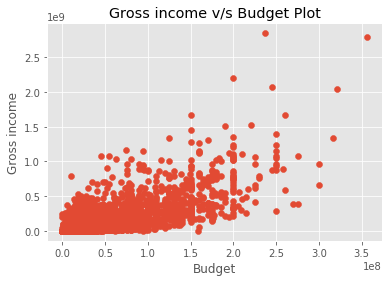

In [71]:
#Visualizing data
#Creating a scatter plot of budget v/s gross income

plt.scatter(x=mod_df['budget'],y=mod_df['gross'])
plt.title('Gross income v/s Budget Plot')
plt.xlabel('Budget')
plt.ylabel('Gross income')
plt.show()

In [97]:
mod_df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
0,The Shining,6,6,1980,1304,8.4,927000,1795,2832,699,46,19000000,46998772,1426,146.0,0,1980
1,The Blue Lagoon,6,1,1980,1127,5.8,65000,1578,1158,214,47,4500000,58853106,452,104.0,0,1980
2,Star Wars: Episode V - The Empire Strikes Back,4,0,1980,1359,8.7,1200000,757,1818,1157,47,18000000,538375067,945,124.0,0,1980
3,Airplane!,4,4,1980,1127,7.7,221000,889,1413,1474,47,3500000,83453539,1108,88.0,0,1980
4,Caddyshack,6,4,1980,1170,7.3,108000,719,351,271,47,6000000,39846344,1083,98.0,0,1980


In [66]:
df['gross'].size

7668

In [67]:
df['budget'].size

7668

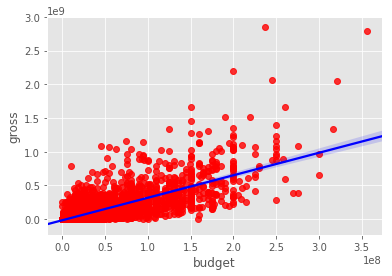

In [72]:
sns.regplot(x='budget',y='gross',data=mod_df,scatter_kws={'color':'red'},line_kws={'color':'blue'})

In [79]:
mod_df.corr(method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


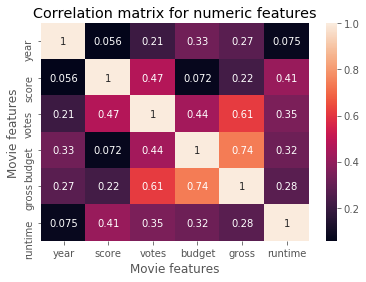

In [82]:
correlation_matrix=mod_df.corr(method='pearson')
sns.heatmap(correlation_matrix,annot=True)
plt.title('Correlation matrix for numeric features')
plt.xlabel('Movie features')
plt.ylabel('Movie features')
plt.show()

In [90]:
df_numerized=mod_df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]=df_numerized[col_name].astype('category')
        df_numerized[col_name]=df_numerized[col_name].cat.codes
df_numerized        

C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
C:\Users\User\Anaconda2\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
0,The Shining,6,6,1980,1304,8.4,927000,1795,2832,699,46,19000000,46998772,1426,146.0,0,1980
1,The Blue Lagoon,6,1,1980,1127,5.8,65000,1578,1158,214,47,4500000,58853106,452,104.0,0,1980
2,Star Wars: Episode V - The Empire Strikes Back,4,0,1980,1359,8.7,1200000,757,1818,1157,47,18000000,538375067,945,124.0,0,1980
3,Airplane!,4,4,1980,1127,7.7,221000,889,1413,1474,47,3500000,83453539,1108,88.0,0,1980
4,Caddyshack,6,4,1980,1170,7.3,108000,719,351,271,47,6000000,39846344,1083,98.0,0,1980
5,Friday the 13th,6,9,1980,1922,6.4,123000,1758,3081,155,47,550000,39754601,1108,95.0,0,1980
6,The Blues Brothers,6,0,1980,1359,7.9,188000,974,576,860,47,27000000,115229890,1397,133.0,0,1980
7,Raging Bull,6,3,1980,530,8.2,330000,1269,1257,1469,47,18000000,23402427,390,129.0,0,1980
8,Superman II,4,0,1980,1346,6.8,101000,1606,1402,595,47,54000000,108185706,548,127.0,1,1981
9,The Long Riders,6,3,1980,1755,7.0,10000,2011,280,402,47,10000000,15795189,1391,100.0,0,1980


In [85]:
mod_df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,updatd_year_of_release,updt_year_of_release
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980,1980


In [92]:
#Checking for the correlations

corr_mat=df_numerized.corr()
corr_pairs=corr_mat.unstack()
corr_pairs

rating                  rating                    1.000000
                        genre                     0.147796
                        year                      0.019499
                        released                  0.018083
                        score                     0.065983
                        votes                     0.006031
                        director                  0.014656
                        writer                   -0.003149
                        star                      0.009196
                        country                   0.008230
                        budget                   -0.203946
                        gross                    -0.181906
                        company                  -0.092357
                        runtime                   0.140792
                        updatd_year_of_release    0.023925
                        updt_year_of_release      0.022021
genre                   rating                    0.1477

In [93]:
sorted_pairs=corr_pairs.sort_values()
sorted_pairs

genre                   budget                   -0.368523
budget                  genre                    -0.368523
genre                   gross                    -0.244101
gross                   genre                    -0.244101
rating                  budget                   -0.203946
budget                  rating                   -0.203946
rating                  gross                    -0.181906
gross                   rating                   -0.181906
votes                   genre                    -0.135990
genre                   votes                    -0.135990
rating                  company                  -0.092357
company                 rating                   -0.092357
country                 updatd_year_of_release   -0.074422
updatd_year_of_release  country                  -0.074422
country                 updt_year_of_release     -0.073569
updt_year_of_release    country                  -0.073569
genre                   year                     -0.0731

In [94]:
high_corr_pairs=sorted_pairs[(sorted_pairs)>0.5]

In [95]:
high_corr_pairs

gross                   votes                     0.614751
votes                   gross                     0.614751
budget                  gross                     0.740247
gross                   budget                    0.740247
updatd_year_of_release  year                      0.990417
year                    updatd_year_of_release    0.990417
updt_year_of_release    updatd_year_of_release    0.991958
updatd_year_of_release  updt_year_of_release      0.991958
updt_year_of_release    year                      0.998726
year                    updt_year_of_release      0.998726
rating                  rating                    1.000000
runtime                 runtime                   1.000000
company                 company                   1.000000
gross                   gross                     1.000000
budget                  budget                    1.000000
country                 country                   1.000000
star                    star                      1.0000

Conclusion:

Gross income and number of votes recieved have a really stong correlation
Company has a very low correlation